# <center> PROJECT-3. EDA + Feature Engineering.

### Определение проблемы
Одна из проблем компании — недобросовестные отели, которые обманывают со своим рейтингом. Один из способов найти такие отели — построить модель, предсказывающую рейтинг отеля. Если прогнозы модели сильно отличаются от фактического результата, возможно, отель играет нечестно и его следует проверить. Наша задача – создать такую ​​модель.

### Импортируем библиотеки

In [1]:
# Для работы с DataFrame
import numpy as np
import pandas as pd
import datetime
import category_encoders as ce
import re
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.downloader.download('vader_lexicon')

# Для создания и обучения модели
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor 
from sklearn import metrics 

# Для рассчёта расстояния
from geopy.distance import geodesic as GD

# Для визуализации
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.style.use('ggplot')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ilyaz\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


### Загружаем данные

In [2]:
# Загружаем DataFrame
hotels_data = pd.read_csv('hotels.csv')

# Создаём копию данных
hotels_df = hotels_data.copy()

### Информация о датасете
- hotel_address — адрес отеля;

- review_date — дата, когда рецензент разместил соответствующий отзыв;

- average_score — средний балл отеля, рассчитанный на основе последнего комментария за последний год;

- hotel_name — название отеля;

- reviewer_nationality — страна рецензента;

- negative_review — отрицательный отзыв, который рецензент дал отелю;

- review_total_negative_word_counts — общее количество слов в отрицательном отзыве;

- positive_review — положительный отзыв, который рецензент дал отелю;

- review_total_positive_word_counts — общее количество слов в положительном отзыве.

- reviewer_score — оценка, которую рецензент поставил отелю на основе своего опыта;

- total_number_of_reviews_reviewer_has_given — количество отзывов, которые рецензенты дали в прошлом;

- total_number_of_reviews — общее количество действительных отзывов об отеле;

- tags — теги, которые рецензент дал отелю;

- days_since_review — количество дней между датой проверки и датой очистки;

- additional_number_of_scoring — есть также некоторые гости, которые просто поставили оценку сервису, но не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.

- lat — географическая широта отеля;

- lng — географическая долгота отеля.

In [ ]:
# Выведем первые пять строк датасета
hotels_df.head()

In [ ]:
# Выведем информацию о признаках
hotels_df.info()

In [ ]:
# Выведем информацию о пропусках
hotels_df.isnull().sum()

### Работаем с пропущенными значениями

In [3]:
hotels_df['lat'].fillna(0, inplace=True)
hotels_df['lng'].fillna(0, inplace=True)

## 1. **Feature engineering** (Создание новых признаков)

### 1.1 review_date

In [4]:
# Переводим признак 'review_date' в dtype 'datetime'
hotels_df['review_date'] = pd.to_datetime(hotels_df['review_date'])

In [5]:
# Из признака 'review_date' выделяем года
hotels_df['review_year'] = 0

def get_year(row):
    row.review_year = row.review_date.strftime("%Y")
    return row

hotels_df = hotels_df.apply(lambda row: get_year(row), axis=1)
hotels_df['review_year'] = hotels_df['review_year'].astype(int)


# Из признака 'review_date' выделяем месяцы
hotels_df['review_month'] = 0

def get_month(row):
    row.review_month = row.review_date.strftime("%m")
    return row

hotels_df = hotels_df.apply(lambda row: get_month(row), axis=1)
hotels_df['review_month'] = hotels_df['review_month'].astype(int)


# Из признака 'review_date' выделяем дни
hotels_df['review_day'] = 0

def get_day(row):
    row.review_day = row.review_date.strftime("%d")
    return row

hotels_df = hotels_df.apply(lambda row: get_day(row), axis=1)
hotels_df['review_day'] = hotels_df['review_day'].astype(int)

### 1.2 days_since_review

In [6]:
# Из признака 'days_since_review' извлекаем количество дней, и преобразовываем признак из dtype 'object' в dtype 'int'
def get_days(days):
    string_list = days.split(' ')
    days_count = string_list[0]
    return days_count

hotels_df['days_since_review'] = hotels_df['days_since_review'].apply(get_days).astype(int)

### 1.3 hotel_address

In [7]:
# Из признака 'hotel_address' выделяем название страны
def get_country_name(string):
    split_string = string.split(' ')
    country_name = split_string[-1]
    if split_string[-1] == 'Kingdom':
        country_name = split_string[-2] + ' ' + split_string[-1]
    return country_name

# Создаём признак, в котором будут указаны названия стран
hotels_df['country_name'] = hotels_df['hotel_address'].apply(get_country_name)



# Создаём признак 'city_name' 
def get_city_name(country):
    if country == 'United Kingdom':
        return 'London'
    elif country == 'Spain':
        return 'Barcelona'
    elif country == 'France':
        return 'Paris'
    elif country == 'Netherlands':
        return 'Amsterdam'
    elif country == 'Austria':
        return 'Vienna'
    else:
        return 'Milan'
    
# Создаём признак, в котором будут указаны названия городов
hotels_df['city_name'] = hotels_df['country_name'].apply(get_city_name)



# Создаём экземпляр класса OneHotEncoder()
encoder = ce.OneHotEncoder(cols=['city_name'])

# Кодируем признак 'city_name' с помощью класса OneHotEncoder()
type_bin = encoder.fit_transform(hotels_df['city_name'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'city_name_1': 'hotel_london',
    'city_name_2': 'hotel_paris',
    'city_name_3': 'hotel_amsterdam',
    'city_name_4': 'hotel_milan',
    'city_name_5': 'hotel_vienna',
    'city_name_6': 'hotel_barcelona'
}, inplace=True)

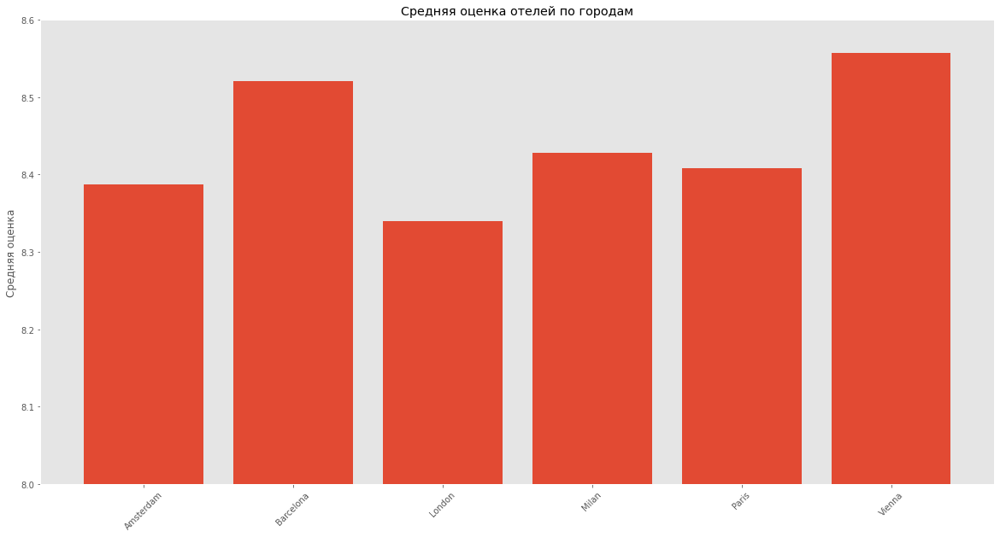

In [14]:
# Построим столбчатую диаграмму рейтинга городов в зависимости от средней оценки отеля
city_rating = hotels_df.groupby(by='city_name')[['average_score']].mean()

fig, ax = plt.subplots(figsize=[20, 10])

ax.bar(city_rating.index, city_rating['average_score'])

ax.set_ylabel('Средняя оценка')
ax.set_title('Средняя оценка отелей по городам')
plt.ylim(8, 8.6)
plt.xticks(rotation = 45)
plt.grid()

plt.show();

### 1.4 positive_review и negative_review

In [8]:
# Создание экземпляра класса SentimentIntensityAnalyzer()
sent_analyzer = SentimentIntensityAnalyzer()

# Производим анализ каждого обзора
def get_review_analysis(review):
    return sent_analyzer.polarity_scores(review)

hotels_df['positive_review_analysis'] = hotels_df['positive_review'].apply(get_review_analysis)

In [9]:
# Создаём отдельные признаки из получившихся ключей: 'neg', 'neu', 'pos', 'compound'

hotels_df['neg_review_sentiments_pos'] = hotels_df['positive_review_analysis'].apply(lambda x: x['neg'])
hotels_df['neg_review_sentiments_pos'] = hotels_df['neg_review_sentiments_pos'].round().astype(int)

hotels_df['neu_review_sentiments_pos'] = hotels_df['positive_review_analysis'].apply(lambda x: x['neu'])
hotels_df['neu_review_sentiments_pos'] = hotels_df['neu_review_sentiments_pos'].round().astype(int)

hotels_df['pos_review_sentiments_pos'] = hotels_df['positive_review_analysis'].apply(lambda x: x['pos'])
hotels_df['pos_review_sentiments_pos'] = hotels_df['pos_review_sentiments_pos'].round().astype(int)

hotels_df['compound_review_sentiments_pos'] = hotels_df['positive_review_analysis'].apply(lambda x: x['compound'])
hotels_df['compound_review_sentiments_pos'] = hotels_df['compound_review_sentiments_pos'].round().astype(int)

In [10]:
def get_review_analysis(review):
    return sent_analyzer.polarity_scores(review)

hotels_df['negative_review_analysis'] = hotels_df['negative_review'].apply(get_review_analysis)

In [11]:
# Создаём отдельные признаки из получившихся ключей: 'neg', 'neu', 'pos', 'compound'

hotels_df['neg_review_sentiments_neg'] = hotels_df['negative_review_analysis'].apply(lambda x: x['neg'])
hotels_df['neg_review_sentiments_neg'] = hotels_df['neg_review_sentiments_neg'].round().astype(int)

hotels_df['neu_review_sentiments_neg'] = hotels_df['negative_review_analysis'].apply(lambda x: x['neu'])
hotels_df['neu_review_sentiments_neg'] = hotels_df['neu_review_sentiments_neg'].round().astype(int)

hotels_df['pos_review_sentiments_neg'] = hotels_df['negative_review_analysis'].apply(lambda x: x['pos'])
hotels_df['pos_review_sentiments_neg'] = hotels_df['pos_review_sentiments_neg'].round().astype(int)

hotels_df['compound_review_sentiments_neg'] = hotels_df['negative_review_analysis'].apply(lambda x: x['compound'])
hotels_df['compound_review_sentiments_neg'] = hotels_df['compound_review_sentiments_neg'].round().astype(int)

### 1.5 lat_city (географическая широта города)

In [12]:
# Создаём функцию для присваивания каждому городу его широты
def get_lat_city(city):
    if city == 'London':
        return 51.508530
    if city == 'Barcelona':
        return 41.388790
    if city == 'Paris':
        return 48.853410
    if city == 'Amsterdam':
        return 52.374030
    if city == 'Vienna':
        return 48.208490
    if city == 'Milan':
        return 45.464270
    
# Применяем полученную функцию к признаку 'hotel_city_name'
hotels_df['lat_city'] = hotels_df['city_name'].apply(get_lat_city)

### 1.6 lng_city (географическая долгота города)

In [13]:
# Создаём функцию для присваивания каждому городу его долготы
def get_lng_city(city):
    if city == 'London':
        return -0.125740
    if city == 'Barcelona':
        return 2.158990
    if city == 'Paris':
        return 2.348800
    if city == 'Amsterdam':
        return 4.889690
    if city == 'Vienna':
        return 16.372080
    if city == 'Milan':
        return 9.189510
    
# Применяем полученную функцию к признаку 'hotel_city_name'
hotels_df['lng_city'] = hotels_df['city_name'].apply(get_lng_city)

### 1.7 hotel_distance_to_center (расстояние от отеля до центра города)

In [14]:
# Используем метод геодезического расстояния с помощью метода geodesic
hotels_df['hotel_distance_to_center'] = 0

def get_distance(row):
    row.hotel_distance_to_center = GD([row.lat_city, row.lng_city], [row.lat, row.lng]).km
    return row

# Создаём признак расстояния от отеля до центра города
hotels_df = hotels_df.apply(lambda row: get_distance(row), axis=1)

# Заменим высокие значения расстояния на 0
def change_to_zero(coordinate):
    if coordinate > 100:
        return 0
    else:
        return coordinate
    
hotels_df['hotel_distance_to_center'] = hotels_df['hotel_distance_to_center'].apply(change_to_zero)

### 1.8 reviewer_nationality

In [15]:
# Создаём функцию для удаления первого и последнего пробела в строках
def delite_spaces(string):
    return string[1:-1]

# Применяем полученную функцию к признаку 'reviewer_nationality'
hotels_df['reviewer_nationality'] = hotels_df['reviewer_nationality'].apply(delite_spaces)

In [16]:
# Создание экземпляра класса LabelEncoder()
lab_enc = LabelEncoder()

# Создаём признак 'reviewer_nationality_num'
hotels_df['reviewer_nationality_num'] = lab_enc.fit_transform(hotels_df['reviewer_nationality'])

In [17]:
# Создаём признак принадлежности рецензента к стране с отелем
hotels_df['reviewer_is_citizen'] = 0

def rev_is_cit(row):
    if row.reviewer_nationality == row.country_name:
        row.reviewer_is_citizen = 1
    else:
        row.reviewer_is_citizen = 0
    return row

# Применяем полученную функцию ко всему датафрейму
hotels_df = hotels_df.apply(lambda row: rev_is_cit(row), axis=1)

In [18]:
# Создаём экземпляр класса BinaryEncoder()
bin_encoder = ce.BinaryEncoder(cols=['reviewer_nationality'])

# Кодируем признак 'reviewer_nationality' с помощью класса BinaryEncoder()
type_bin = bin_encoder.fit_transform(hotels_df['reviewer_nationality'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin], axis=1)

### 1.9 tags

In [19]:
# Конвертируем строки признака 'tags' в списки
def re_func(list_tags):
    found = re.findall("'[^\'](.+?)[^\']'", list_tags)
    return found

hotels_df['tags'] = hotels_df['tags'].apply(re_func)

In [20]:
# Создаём признак 'count_tags' (количество тегов)
def get_tags_count(list_tags):
    return len(list_tags)

hotels_df['count_tags'] = hotels_df['tags'].apply(get_tags_count)

Создаём признаки классификации типа поездки

In [21]:
# Создаём признак 'type_of_trip' (Выделяем тип поездки)
def get_type(list):
    for tag in list:
        if 'Business trip' in tag:
            return 'Business trip'
        elif 'Leisure trip' in tag:
            return 'Leisure trip'
    else:
        return 'Unknown trip'
    
hotels_df['type_of_trip'] = hotels_df['tags'].apply(get_type)



# Создаём экземпляр класса OneHotEncoder()
encoder_type = ce.OneHotEncoder(cols=['type_of_trip'])

# Кодируем признак 'type_of_trip' с помощью класса OneHotEncoder()
type_bin_type = encoder_type.fit_transform(hotels_df['type_of_trip'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin_type], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'type_of_trip_1': 'leisure_trip',
    'type_of_trip_2': 'business_trip',
    'type_of_trip_3': 'unknown_trip'
}, inplace=True)

Создаём признаки классификации типа комнат

In [22]:
# Выделяем из тэгов все типы комнат, и создаём признак 'hotel_rooms'
def get_rooms(list):
    for tag in list:
        if 'room' in tag:
            return tag
        elif 'Room' in tag:
            return tag
    else:
        return 'Unknown room'
    
hotels_df['hotel_rooms'] = hotels_df['tags'].apply(get_rooms)



# Выделяем типы комнат, в которые чаще всего заселяются и создаём признак 'hotel_rooms_class'
rooms_list = [
    'Double Room',
    'Standard Double Room',
    'Superior Double Room'
]

def get_room_class(room):
    if room in rooms_list:
        return room
    else:
        return 'Other'
    
hotels_df['hotel_rooms_class'] = hotels_df['hotel_rooms'].apply(get_room_class)



# Создаём экземпляр класса OneHotEncoder()
encoder_room = ce.OneHotEncoder(cols=['hotel_rooms_class'])

# Кодируем признак 'hotel_rooms_class' с помощью класса OneHotEncoder()
type_bin_room = encoder_room.fit_transform(hotels_df['hotel_rooms_class'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin_room], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'hotel_rooms_class_1': 'other_rooms',
    'hotel_rooms_class_2': 'standard_double_room',
    'hotel_rooms_class_3': 'superior_double_room',
    'hotel_rooms_class_4': 'double_room'
}, inplace=True)

Создаём признаки классификации группы поездки

In [23]:
# Выделяем из тэгов категории групп туристов. Создаём признак 'group_class'
def get_group(list):
    for tag in list:
        if 'Couple' in tag:
            return 'Couple'
        elif 'Family with older children' in tag:
            return 'Family with older children'
        elif 'Family with young children' in tag:
            return 'Family with young children'
        elif 'Group' in tag:
            return 'Group'
        elif 'Solo traveler' in tag:
            return 'Solo traveler'
        elif 'Travelers with friends' in tag:
            return 'Travelers with friends'
        elif 'With a pet' in tag:
            return 'With a pet'
    else:
        return 'Unknown group'
    
hotels_df['group_class'] = hotels_df['tags'].apply(get_group)



# Создаём экземпляр класса OneHotEncoder()
encoder_group = ce.OneHotEncoder(cols=['group_class'])

# Кодируем признак 'group_class' с помощью класса OneHotEncoder()
type_bin_group = encoder_group.fit_transform(hotels_df['group_class'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin_group], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'group_class_1': 'trip_couple',
    'group_class_2': 'trip_solo',
    'group_class_3': 'trip_with_young_children',
    'group_class_4': 'trip_group',
    'group_class_5': 'trip_with_older_children',
    'group_class_6': 'trip_with_friends',
    'group_class_7': 'trip_with_a_pet'
}, inplace=True)

Создаём признаки, классифицирующие количества проведённых ночей

In [24]:
# Выделяем тэги, обозначающие количества проведённых ночей в отеле. Создаём признак 'length_of_stay'
def nights_count(list):
    for tag in list:
        if 'Stayed' in tag.split(' '):
            return tag
    else:
        return 'Unknown number'
    
hotels_df['length_of_stay'] = hotels_df['tags'].apply(nights_count)

In [25]:
count_of_nights_list = [
    'Stayed 1 night',
    'Stayed 2 nights',
    'Stayed 3 nights',
    'Stayed 4 nights',
    'Stayed 5 nights'
]

# Создаём функцию, которая будет возвращать тэг из списка (если будет найдено соответствие),
# либо строку 'more then 5 nights'
def get_nights_count(tag):
    if tag in count_of_nights_list:
        return tag
    else:
        return 'more then 5 nights'

hotels_df['nights_classification'] = hotels_df['length_of_stay'].apply(get_nights_count)



# Создаём экземпляр класса OneHotEncoder()
encoder = ce.OneHotEncoder(cols=['nights_classification'])

# Кодируем признак 'nights_classification' с помощью класса OneHotEncoder()
type_bin = encoder.fit_transform(hotels_df['nights_classification'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'nights_classification_1': 'stayed_2_nights',
    'nights_classification_2': 'stayed_1_night',
    'nights_classification_3': 'stayed_3_nights',
    'nights_classification_4': 'stayed_more_than_5_nights',
    'nights_classification_5': 'stayed_4_nights',
    'nights_classification_6': 'stayed_5_nights'
}, inplace=True)

Создаём признаки, классифицирующие помещения

In [26]:
# Выделяем тэги, обозначающие размеры помещений. Создаём признак 'size_of_apartments'
def get_size(list):
    for tag in list:
        if 'tandard' in tag:
            return 'Standard'
        elif 'edroom' in tag:
            return 'Bedroom'
        elif 'uperior' in tag:
            return 'Superior'
        elif 'tudio' in tag:
            return 'Studio'
        elif 'amily room' in tag:
            return 'Family room'
        elif 'uite' in tag:
            return 'Suite'
        elif 'uplex' in tag:
            return 'Duplex'
        elif 'partment' in tag:
            return 'Apartment'
    else:
        return 'Other'
        
hotels_df['size_of_apartments'] = hotels_df['tags'].apply(get_size)



# Создаём экземпляр класса OneHotEncoder()
encoder_size = ce.OneHotEncoder(cols=['size_of_apartments'])

# Кодируем признак 'size_of_apartments' с помощью класса OneHotEncoder()
type_bin_size = encoder_size.fit_transform(hotels_df['size_of_apartments'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin_size], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'size_of_apartments_1': 'studio_class',
    'size_of_apartments_2': 'standard_class',
    'size_of_apartments_3': 'other_class',
    'size_of_apartments_4': 'superior_class',
    'size_of_apartments_5': 'bedroom_class',
    'size_of_apartments_6': 'suite_class',
    'size_of_apartments_7': 'apartment_class',
    'size_of_apartments_8': 'duplex_class',
    'size_of_apartments_9': 'family_room_class'
}, inplace=True)

Создаём признаки, классифицирующие размеры помещений

In [27]:
# Выделяем тэги, обозначающие варианты размещений. Создаём признак 'accommodation_options'
def get_number_guests(list):
    for tag in list:
        if 'ingle' in tag:
            return 'Single'
        elif 'ouble' in tag:
            return 'Double'
        elif 'riple' in tag:
            return 'Triple'
    else:
        return 'Unknown'
    
hotels_df['accommodation_options'] = hotels_df['tags'].apply(get_number_guests)



# Создаём экземпляр класса OneHotEncoder()
encoder_options = ce.OneHotEncoder(cols=['accommodation_options'])

# Кодируем признак 'accommodation_options' с помощью класса OneHotEncoder()
type_bin_options = encoder_options.fit_transform(hotels_df['accommodation_options'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin_options], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'accommodation_options_1': 'unknown_option',
    'accommodation_options_2': 'double_option',
    'accommodation_options_3': 'triple_option',
    'accommodation_options_4': 'single_option'
}, inplace=True)

Создаём признаки с классификацией размеров кроватей

In [28]:
# Выделяем тэги, обозначающие размеры кравати в номере. Создаём признак 'bed_size'
def get_bed_size(list):
    for tag in list:
        if 'Double Bed' in tag:
            return 'Double Bed'
        elif 'Queen Bed' in tag:
            return 'Queen Bed'
        elif 'Queensize Bed' in tag:
            return 'Queen Bed'
        elif 'Queen size Bed' in tag:
            return 'Queen Bed'
        elif 'Queen Room' in tag:
            return 'Queen Bed'
        elif 'Twin Bed' in tag:
            return 'Twin Bed'
        elif 'Sofa Bed' in tag:
            return 'Sofa Bed'
        elif 'Single Bed' in tag:
            return 'Single Bed'
        elif ' King' in tag:
            return 'King Bed'
    else:
        return 'Other Beds'
    
hotels_df['bed_size'] = hotels_df['tags'].apply(get_bed_size)



# Создаём экземпляр класса OneHotEncoder()
encoder = ce.OneHotEncoder(cols=['bed_size'])

# Кодируем признак 'bed_size' с помощью класса OneHotEncoder()
type_bin = encoder.fit_transform(hotels_df['bed_size'])

# Объединяем оба датасета
hotels_df = pd.concat([hotels_df, type_bin], axis=1)



# Переименовываем полученные признаки
hotels_df.rename(columns={
    'bed_size_1': 'other_beds',
    'bed_size_2': 'double_bed',
    'bed_size_3': 'king_bed',
    'bed_size_4': 'queen_bed',
    'bed_size_5': 'single_bed',
    'bed_size_6': 'sofa_bed',
    'bed_size_7': 'twin_bed'
}, inplace=True)

### Удаляем ненужные признаки

In [29]:
# Удаляем признаки типа object
object_columns = [features for features in hotels_df.columns if hotels_df[features].dtype == 'object']
hotels_df.drop(object_columns, axis=1, inplace=True)

# Удаляем признак 'review_date'
hotels_df = hotels_df.drop('review_date', axis=1)

In [ ]:
# Выводим информацию получившегося датасета
hotels_df.info()

In [ ]:
# Выводим информацию о пропусках получившегося датасета
hotels_df.isnull().sum()

## 2. **Отбор признаков**

### 2.1 Строим график распределения признаков

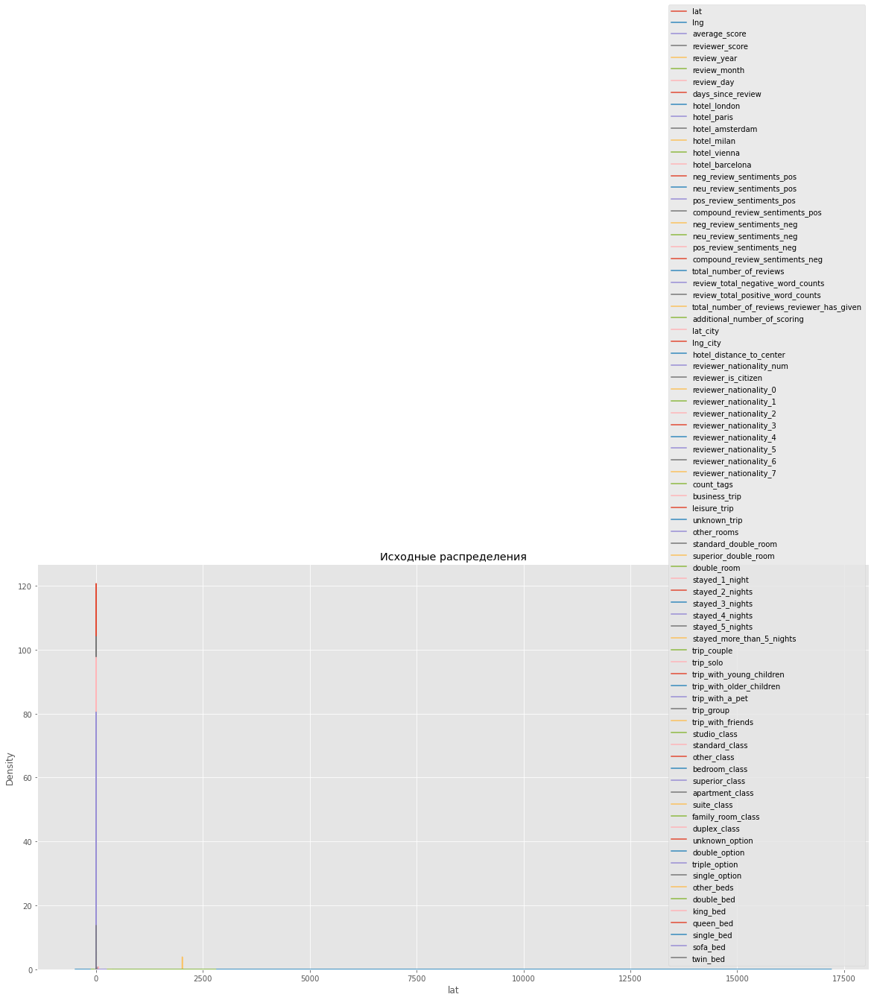

In [32]:
# Строим график распределения
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Исходные распределения')

sns.kdeplot(hotels_df['lat'], ax=ax1, label='lat')
sns.kdeplot(hotels_df['lng'], ax=ax1, label='lng')
sns.kdeplot(hotels_df['average_score'], ax=ax1, label='average_score')
sns.kdeplot(hotels_df['reviewer_score'], ax=ax1, label='reviewer_score')
sns.kdeplot(hotels_df['review_year'], ax=ax1, label='review_year')
sns.kdeplot(hotels_df['review_month'], ax=ax1, label='review_month')
sns.kdeplot(hotels_df['review_day'], ax=ax1, label='review_day')
sns.kdeplot(hotels_df['days_since_review'], ax=ax1, label='days_since_review')
sns.kdeplot(hotels_df['hotel_london'], ax=ax1, label='hotel_london')
sns.kdeplot(hotels_df['hotel_paris'], ax=ax1, label='hotel_paris')
sns.kdeplot(hotels_df['hotel_amsterdam'], ax=ax1, label='hotel_amsterdam')
sns.kdeplot(hotels_df['hotel_milan'], ax=ax1, label='hotel_milan')
sns.kdeplot(hotels_df['hotel_vienna'], ax=ax1, label='hotel_vienna')
sns.kdeplot(hotels_df['hotel_barcelona'], ax=ax1, label='hotel_barcelona')
sns.kdeplot(hotels_df['neg_review_sentiments_pos'], ax=ax1, label='neg_review_sentiments_pos')
sns.kdeplot(hotels_df['neu_review_sentiments_pos'], ax=ax1, label='neu_review_sentiments_pos')
sns.kdeplot(hotels_df['pos_review_sentiments_pos'], ax=ax1, label='pos_review_sentiments_pos')
sns.kdeplot(hotels_df['compound_review_sentiments_pos'], ax=ax1, label='compound_review_sentiments_pos')
sns.kdeplot(hotels_df['neg_review_sentiments_neg'], ax=ax1, label='neg_review_sentiments_neg')
sns.kdeplot(hotels_df['neu_review_sentiments_neg'], ax=ax1, label='neu_review_sentiments_neg')
sns.kdeplot(hotels_df['pos_review_sentiments_neg'], ax=ax1, label='pos_review_sentiments_neg')
sns.kdeplot(hotels_df['compound_review_sentiments_neg'], ax=ax1, label='compound_review_sentiments_neg')
sns.kdeplot(hotels_df['total_number_of_reviews'], ax=ax1, label='total_number_of_reviews')
sns.kdeplot(hotels_df['review_total_negative_word_counts'], ax=ax1, label='review_total_negative_word_counts')
sns.kdeplot(hotels_df['review_total_positive_word_counts'], ax=ax1, label='review_total_positive_word_counts')
sns.kdeplot(hotels_df['total_number_of_reviews_reviewer_has_given'], ax=ax1, label='total_number_of_reviews_reviewer_has_given')
sns.kdeplot(hotels_df['additional_number_of_scoring'], ax=ax1, label='additional_number_of_scoring')
sns.kdeplot(hotels_df['lat_city'], ax=ax1, label='lat_city')
sns.kdeplot(hotels_df['lng_city'], ax=ax1, label='lng_city')
sns.kdeplot(hotels_df['hotel_distance_to_center'], ax=ax1, label='hotel_distance_to_center')
sns.kdeplot(hotels_df['reviewer_nationality_num'], ax=ax1, label='reviewer_nationality_num')
sns.kdeplot(hotels_df['reviewer_is_citizen'], ax=ax1, label='reviewer_is_citizen')
sns.kdeplot(hotels_df['reviewer_nationality_0'], ax=ax1, label='reviewer_nationality_0')
sns.kdeplot(hotels_df['reviewer_nationality_1'], ax=ax1, label='reviewer_nationality_1')
sns.kdeplot(hotels_df['reviewer_nationality_2'], ax=ax1, label='reviewer_nationality_2')
sns.kdeplot(hotels_df['reviewer_nationality_3'], ax=ax1, label='reviewer_nationality_3')
sns.kdeplot(hotels_df['reviewer_nationality_4'], ax=ax1, label='reviewer_nationality_4')
sns.kdeplot(hotels_df['reviewer_nationality_5'], ax=ax1, label='reviewer_nationality_5')
sns.kdeplot(hotels_df['reviewer_nationality_6'], ax=ax1, label='reviewer_nationality_6')
sns.kdeplot(hotels_df['reviewer_nationality_7'], ax=ax1, label='reviewer_nationality_7')
sns.kdeplot(hotels_df['count_tags'], ax=ax1, label='count_tags')
sns.kdeplot(hotels_df['business_trip'], ax=ax1, label='business_trip')
sns.kdeplot(hotels_df['leisure_trip'], ax=ax1, label='leisure_trip')
sns.kdeplot(hotels_df['unknown_trip'], ax=ax1, label='unknown_trip')
sns.kdeplot(hotels_df['other_rooms'], ax=ax1, label='other_rooms')
sns.kdeplot(hotels_df['standard_double_room'], ax=ax1, label='standard_double_room')
sns.kdeplot(hotels_df['superior_double_room'], ax=ax1, label='superior_double_room')
sns.kdeplot(hotels_df['double_room'], ax=ax1, label='double_room')
sns.kdeplot(hotels_df['stayed_1_night'], ax=ax1, label='stayed_1_night')
sns.kdeplot(hotels_df['stayed_2_nights'], ax=ax1, label='stayed_2_nights')
sns.kdeplot(hotels_df['stayed_3_nights'], ax=ax1, label='stayed_3_nights')
sns.kdeplot(hotels_df['stayed_4_nights'], ax=ax1, label='stayed_4_nights')
sns.kdeplot(hotels_df['stayed_5_nights'], ax=ax1, label='stayed_5_nights')
sns.kdeplot(hotels_df['stayed_more_than_5_nights'], ax=ax1, label='stayed_more_than_5_nights')
sns.kdeplot(hotels_df['trip_couple'], ax=ax1, label='trip_couple')
sns.kdeplot(hotels_df['trip_solo'], ax=ax1, label='trip_solo')
sns.kdeplot(hotels_df['trip_with_young_children'], ax=ax1, label='trip_with_young_children')
sns.kdeplot(hotels_df['trip_with_older_children'], ax=ax1, label='trip_with_older_children')
sns.kdeplot(hotels_df['trip_with_a_pet'], ax=ax1, label='trip_with_a_pet')
sns.kdeplot(hotels_df['trip_group'], ax=ax1, label='trip_group')
sns.kdeplot(hotels_df['trip_with_friends'], ax=ax1, label='trip_with_friends')
sns.kdeplot(hotels_df['studio_class'], ax=ax1, label='studio_class')
sns.kdeplot(hotels_df['standard_class'], ax=ax1, label='standard_class')
sns.kdeplot(hotels_df['other_class'], ax=ax1, label='other_class')
sns.kdeplot(hotels_df['bedroom_class'], ax=ax1, label='bedroom_class')
sns.kdeplot(hotels_df['superior_class'], ax=ax1, label='superior_class')
sns.kdeplot(hotels_df['apartment_class'], ax=ax1, label='apartment_class')
sns.kdeplot(hotels_df['suite_class'], ax=ax1, label='suite_class')
sns.kdeplot(hotels_df['family_room_class'], ax=ax1, label='family_room_class')
sns.kdeplot(hotels_df['duplex_class'], ax=ax1, label='duplex_class')
sns.kdeplot(hotels_df['unknown_option'], ax=ax1, label='unknown_option')
sns.kdeplot(hotels_df['double_option'], ax=ax1, label='double_option')
sns.kdeplot(hotels_df['triple_option'], ax=ax1, label='triple_option')
sns.kdeplot(hotels_df['single_option'], ax=ax1, label='single_option')
sns.kdeplot(hotels_df['other_beds'], ax=ax1, label='other_beds')
sns.kdeplot(hotels_df['double_bed'], ax=ax1, label='double_bed')
sns.kdeplot(hotels_df['king_bed'], ax=ax1, label='king_bed')
sns.kdeplot(hotels_df['queen_bed'], ax=ax1, label='queen_bed')
sns.kdeplot(hotels_df['single_bed'], ax=ax1, label='single_bed')
sns.kdeplot(hotels_df['sofa_bed'], ax=ax1, label='sofa_bed')
sns.kdeplot(hotels_df['twin_bed'], ax=ax1, label='twin_bed')
plt.legend()

Из полученного графика можно сделать вывод, что признаки в основном распределены нормально. Следовательно ни нормализация ни стандартизация данным признакам не требуется.

In [33]:
# Выведем описание всех признаков
hotels_df.describe()

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,days_since_review,lat,lng,...,double_option,triple_option,single_option,other_beds,double_bed,king_bed,queen_bed,single_bed,sofa_bed,twin_bed
count,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.00000,386803.000000,386803.000000,386803.000000,386803.000000,...,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000,386803.000000
mean,498.246536,8.397231,18.538988,2743.992042,17.776985,7.17725,8.396906,354.387978,49.130604,2.805533,...,0.584794,0.018787,0.052546,0.878757,0.010882,0.055734,0.047037,0.003532,0.004041,0.000018
std,500.258012,0.547881,29.703369,2316.457018,21.726141,11.05442,1.636090,208.975174,5.226613,4.570018,...,0.492758,0.135773,0.223126,0.326409,0.103745,0.229407,0.211718,0.059322,0.063439,0.004254
min,1.000000,5.200000,0.000000,43.000000,0.000000,1.00000,2.500000,0.000000,0.000000,-0.369758,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,169.000000,8.100000,2.000000,1161.000000,5.000000,1.00000,7.500000,175.000000,48.212857,-0.143372,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,342.000000,8.400000,9.000000,2134.000000,11.000000,3.00000,8.800000,353.000000,51.499981,0.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,660.000000,8.800000,23.000000,3613.000000,22.000000,8.00000,9.600000,527.000000,51.516288,4.831098,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2682.000000,9.800000,408.000000,16670.000000,395.000000,355.00000,10.000000,730.000000,52.400181,16.429233,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 2.2 Проводим корреляционный анализ

Разделим данные

In [34]:
# Составляем список факторов (исключили целевой столбец)
features = hotels_df.drop('reviewer_score', axis=1).columns

# Составляем матрицу наблюдений X и вектор правильных ответов y
X = hotels_df[features]
y = hotels_df['reviewer_score']

In [35]:
# Копируем названия столбцов, которые теряются при использовании fit_transform()
col_names = list(X.columns)

Построим тепловую карту корреляций признаков.

<AxesSubplot:>

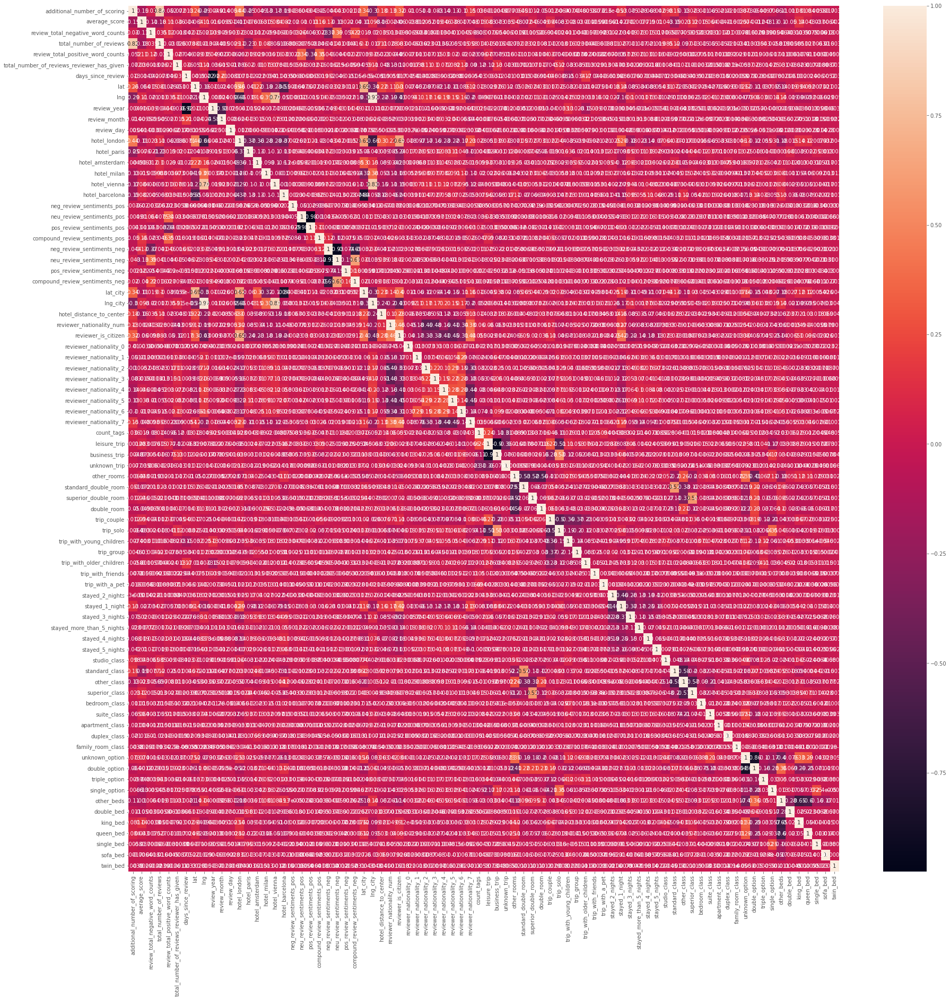

In [36]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X.corr(), annot=True)

Построим график, на котором отобразим признаки по их важности 

<AxesSubplot:>

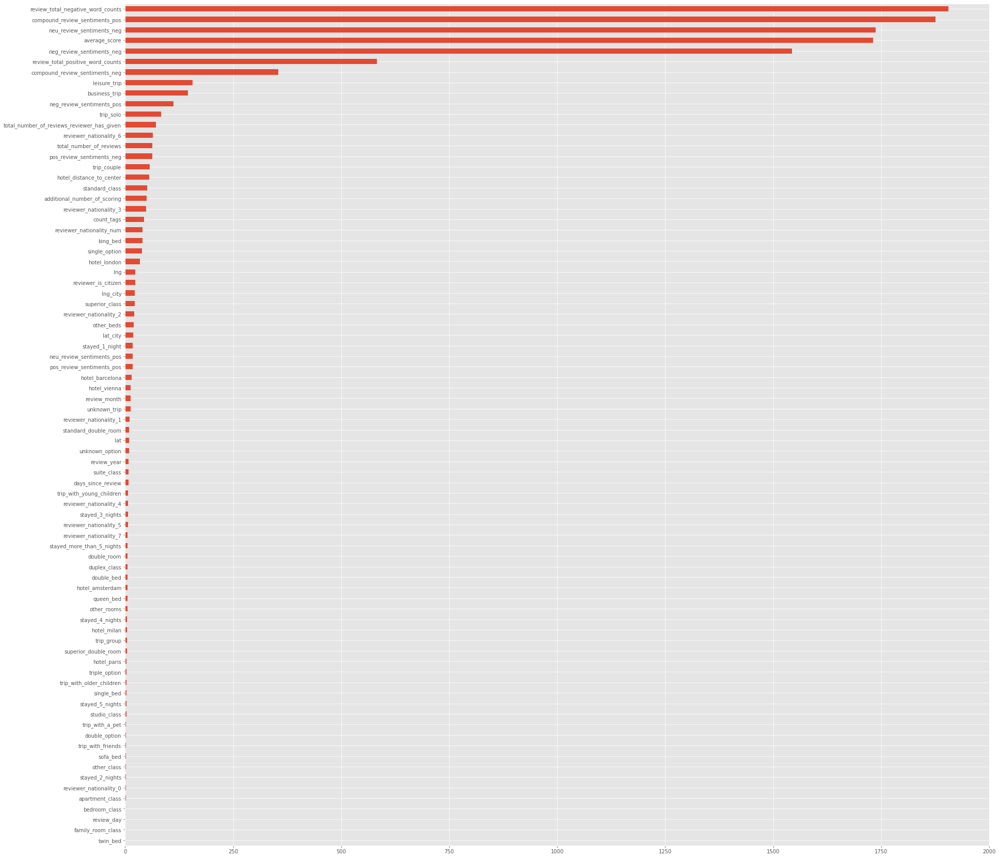

In [37]:
# Для оценки значимости переменных будем использовать функцию f_classif
imp_num = pd.Series(f_classif(X[col_names], y)[0], index=col_names)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

Удаляем признаки с высокой корреляцией

In [38]:
X = X.drop([
    'additional_number_of_scoring',
    'days_since_review',
    'hotel_vienna',
    'lng_city',
    'pos_review_sentiments_pos',
    'neg_review_sentiments_neg',
    'lat',
    'business_trip',
    'double_option',
    'hotel_barcelona',
    'lng'
], axis=1)

Для того, чтобы убедиться в отсутствии высококоррелированных связей между признаками повторно выводим тепловую карту

<AxesSubplot:>

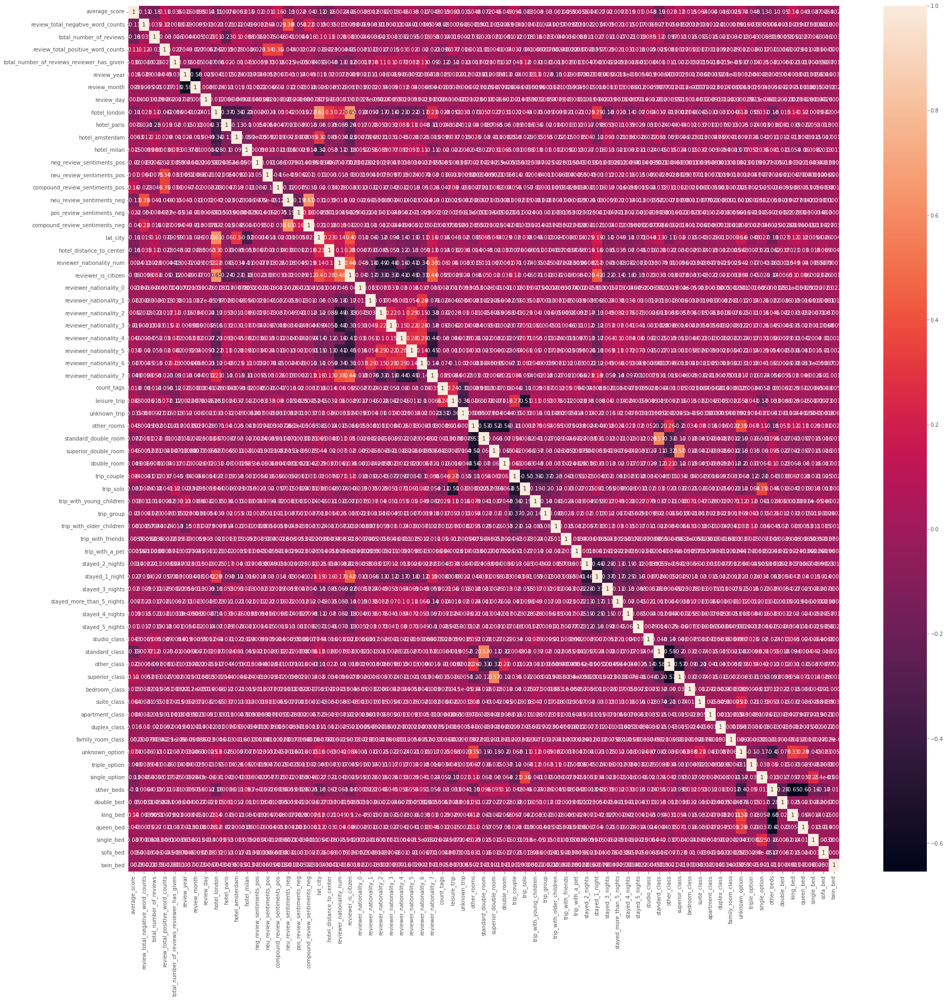

In [39]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X.corr(), annot=True)

## 3. **Machine Learning** (Строим модель)

In [40]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" — для тестирования.
# Для тестирования мы будем использовать 25 % от исходного датасета.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Создаём модель
regr = RandomForestRegressor(n_estimators=100)

# Обучаем модель на тренировочном наборе данных
regr.fit(X_train, y_train)

# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_pred 
y_pred = regr.predict(X_test)

In [41]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))

MAPE: 0.12836726625246722


### <center> Воспользуемся методом нормализации данных (MinMaxScaler)

No handles with labels found to put in legend.


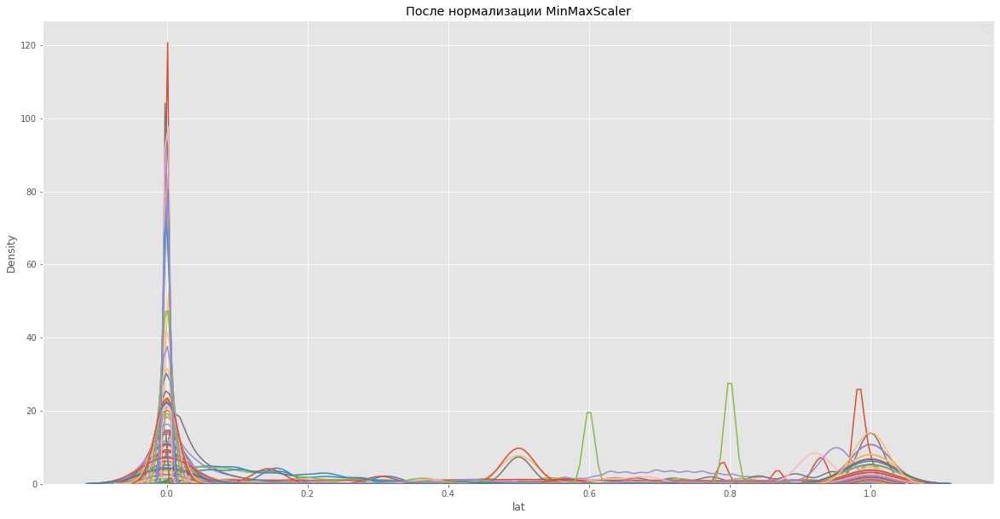

In [47]:
# Инициализируем нормализатор MinMaxScaler
mm_scaler = preprocessing.MinMaxScaler()

# Кодируем исходный датасет
hotels_df_mm = mm_scaler.fit_transform(hotels_df)

# Преобразуем промежуточный датасет в полноценный датафрейм для визуализации
hotels_df_mm = pd.DataFrame(hotels_df_mm, columns=list(hotels_df.columns))

fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('После нормализации MinMaxScaler')

sns.kdeplot(hotels_df_mm['lat'], ax=ax1)
sns.kdeplot(hotels_df_mm['lng'], ax=ax1)
sns.kdeplot(hotels_df_mm['average_score'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_score'], ax=ax1)
sns.kdeplot(hotels_df_mm['review_year'], ax=ax1)
sns.kdeplot(hotels_df_mm['review_month'], ax=ax1)
sns.kdeplot(hotels_df_mm['review_day'], ax=ax1)
sns.kdeplot(hotels_df_mm['days_since_review'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_london'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_paris'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_amsterdam'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_milan'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_vienna'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_barcelona'], ax=ax1)
sns.kdeplot(hotels_df_mm['neg_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_mm['neu_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_mm['pos_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_mm['compound_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_mm['neg_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_mm['neu_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_mm['pos_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_mm['compound_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_mm['total_number_of_reviews'], ax=ax1)
sns.kdeplot(hotels_df_mm['review_total_negative_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_mm['review_total_positive_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_mm['total_number_of_reviews_reviewer_has_given'], ax=ax1)
sns.kdeplot(hotels_df_mm['additional_number_of_scoring'], ax=ax1)
sns.kdeplot(hotels_df_mm['lat_city'], ax=ax1)
sns.kdeplot(hotels_df_mm['lng_city'], ax=ax1)
sns.kdeplot(hotels_df_mm['hotel_distance_to_center'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_num'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_is_citizen'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_0'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_1'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_2'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_3'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_4'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_5'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_6'], ax=ax1)
sns.kdeplot(hotels_df_mm['reviewer_nationality_7'], ax=ax1)
sns.kdeplot(hotels_df_mm['count_tags'], ax=ax1)
sns.kdeplot(hotels_df_mm['business_trip'], ax=ax1)
sns.kdeplot(hotels_df_mm['leisure_trip'], ax=ax1)
sns.kdeplot(hotels_df_mm['unknown_trip'], ax=ax1)
sns.kdeplot(hotels_df_mm['other_rooms'], ax=ax1)
sns.kdeplot(hotels_df_mm['standard_double_room'], ax=ax1)
sns.kdeplot(hotels_df_mm['superior_double_room'], ax=ax1)
sns.kdeplot(hotels_df_mm['double_room'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_1_night'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_2_nights'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_3_nights'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_4_nights'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_mm['stayed_more_than_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_couple'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_solo'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_with_young_children'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_with_older_children'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_with_a_pet'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_group'], ax=ax1)
sns.kdeplot(hotels_df_mm['trip_with_friends'], ax=ax1)
sns.kdeplot(hotels_df_mm['studio_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['standard_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['other_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['bedroom_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['superior_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['apartment_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['suite_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['family_room_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['duplex_class'], ax=ax1)
sns.kdeplot(hotels_df_mm['unknown_option'], ax=ax1)
sns.kdeplot(hotels_df_mm['double_option'], ax=ax1)
sns.kdeplot(hotels_df_mm['triple_option'], ax=ax1)
sns.kdeplot(hotels_df_mm['single_option'], ax=ax1)
sns.kdeplot(hotels_df_mm['other_beds'], ax=ax1)
sns.kdeplot(hotels_df_mm['double_bed'], ax=ax1)
sns.kdeplot(hotels_df_mm['king_bed'], ax=ax1)
sns.kdeplot(hotels_df_mm['queen_bed'], ax=ax1)
sns.kdeplot(hotels_df_mm['single_bed'], ax=ax1)
sns.kdeplot(hotels_df_mm['sofa_bed'], ax=ax1)
sns.kdeplot(hotels_df_mm['twin_bed'], ax=ax1)
plt.legend()

In [48]:
# Составляем список факторов (исключили целевой столбец)
features_mm = hotels_df_mm.drop('reviewer_score', axis=1).columns

# Составляем матрицу наблюдений X_mm и вектор правильных ответов y_mm
X_mm = hotels_df_mm[features_mm]
y_mm = hotels_df_mm['reviewer_score']

<AxesSubplot:>

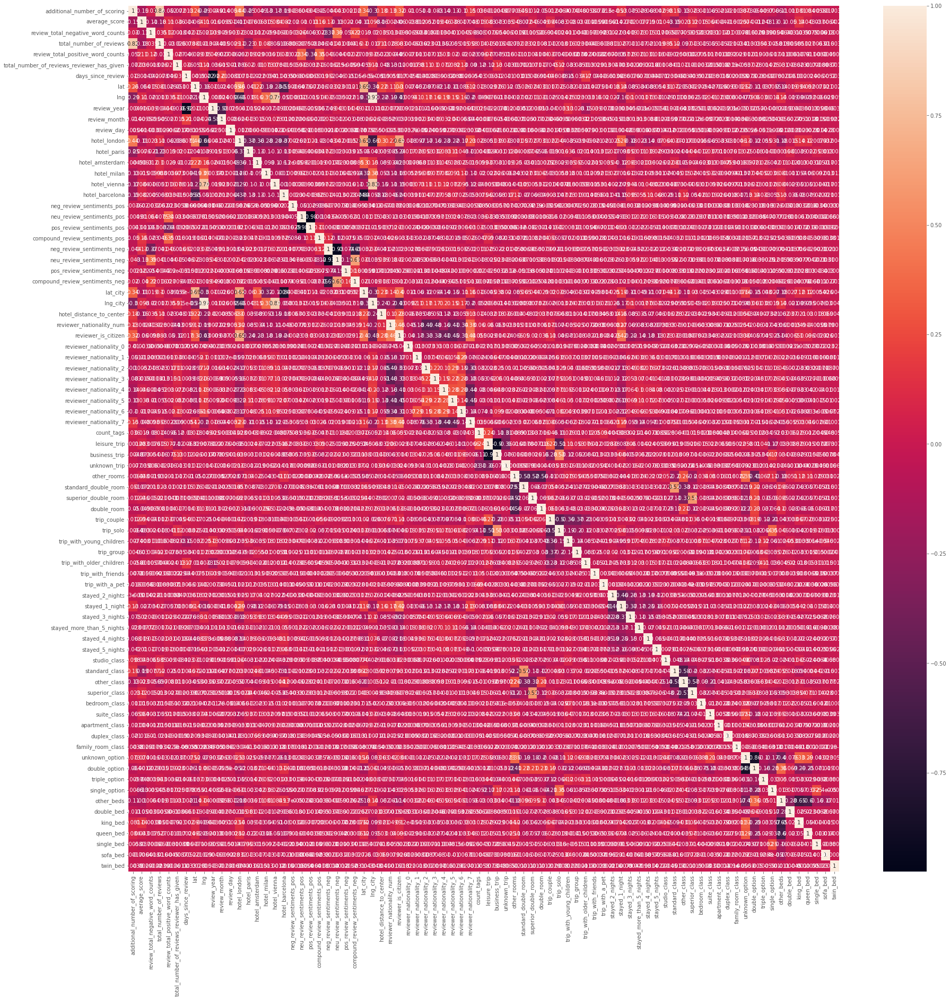

In [49]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_mm.corr(), annot=True)

<AxesSubplot:>

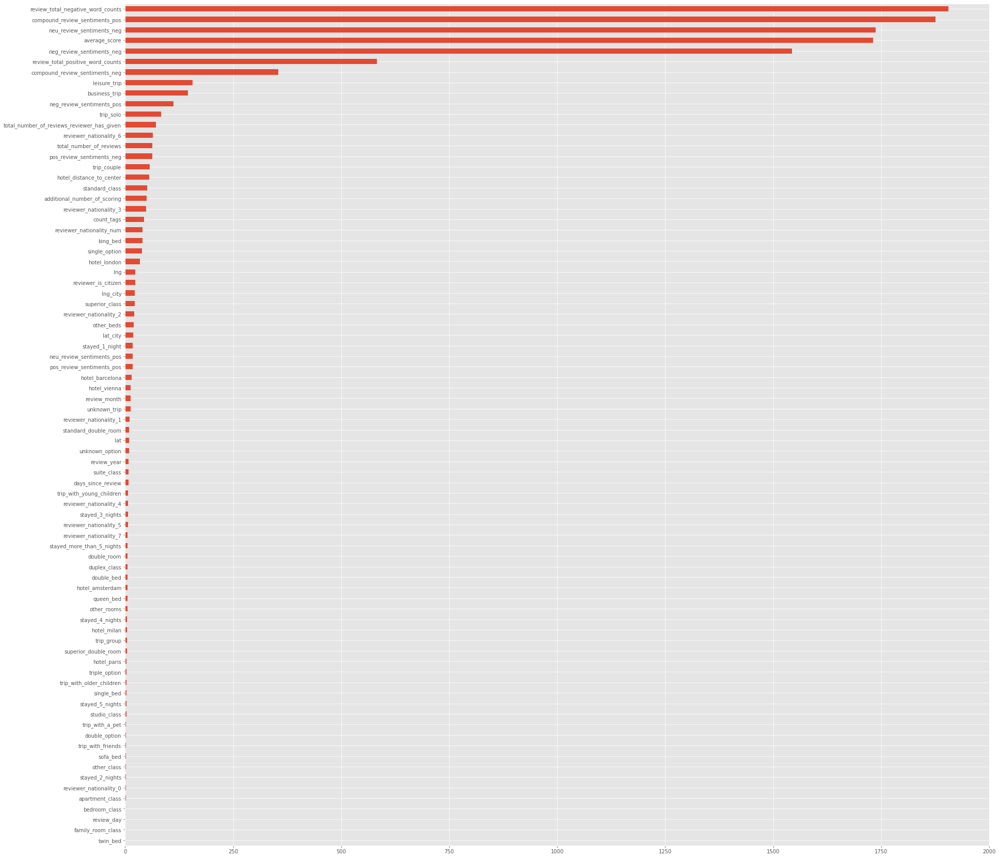

In [51]:
# Для оценки значимости переменных будем использовать функцию f_classif
imp_num = pd.Series(f_classif(X_mm[col_names], y_mm)[0], index=col_names)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

In [52]:
# Удаляем признаки с высокой корреляцией
X_mm = X_mm.drop([
    'additional_number_of_scoring',
    'days_since_review',
    'hotel_vienna',
    'lng_city',
    'pos_review_sentiments_pos',
    'neg_review_sentiments_neg',
    'lat',
    'business_trip',
    'double_option',
    'hotel_barcelona',
    'lng'
], axis=1)

Для того, чтобы убедиться в отсутствии высококоррелированных связей между признаками повторно выводим тепловую карту

<AxesSubplot:>

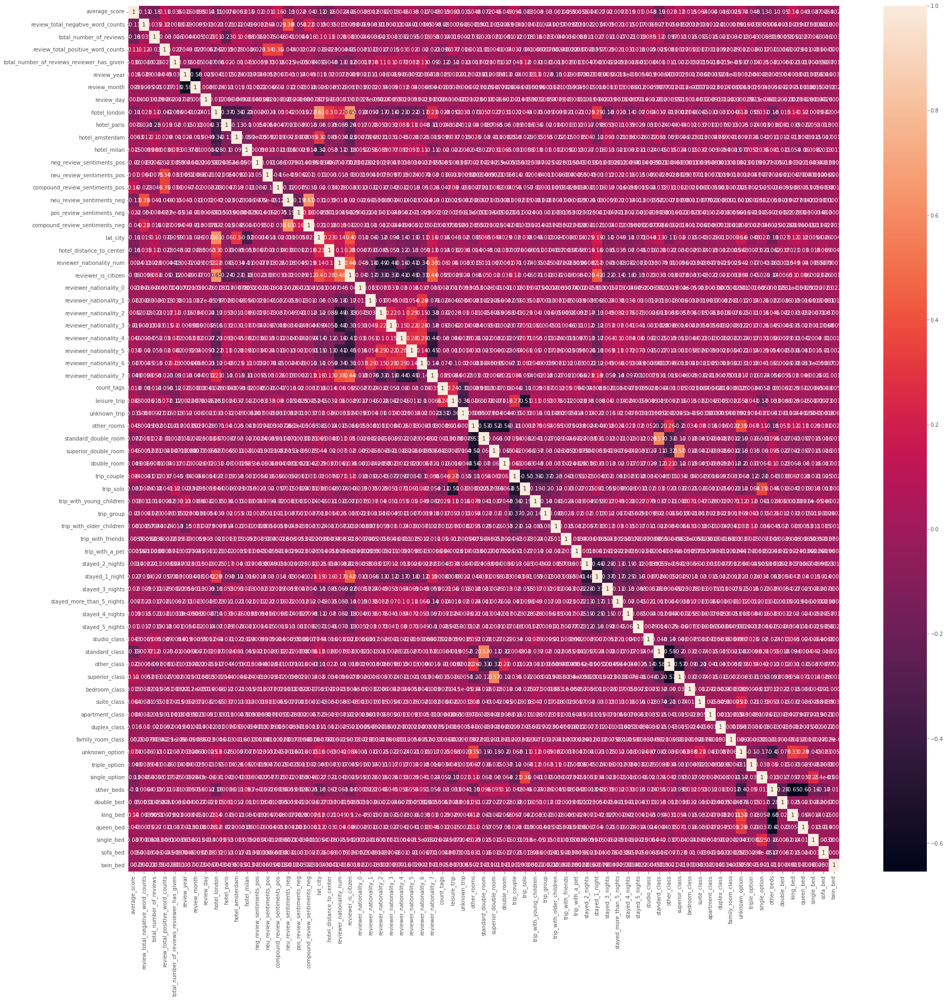

In [53]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_mm.corr(), annot=True)

In [54]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" — для тестирования.
# Для тестирования мы будем использовать 25 % от исходного датасета.
X_mm_train, X_mm_test, y_mm_train, y_mm_test = train_test_split(X_mm, y_mm, test_size=0.25, random_state=42)

# Создаём модель
regr_mm = RandomForestRegressor(n_estimators=100)

# Обучаем модель на тренировочном наборе данных
regr_mm.fit(X_mm_train, y_mm_train)

# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_mm_pred
y_mm_pred = regr_mm.predict(X_mm_test)

In [55]:
# Сравниваем предсказанные значения (y_mm_pred) с реальными (y_mm_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.
print('MAPE mm:', metrics.mean_absolute_percentage_error(y_mm_test, y_mm_pred))

MAPE mm: 9550506901745.434


### <center> Воспользуемся методом нормализации данных (RobustScaler)

No handles with labels found to put in legend.


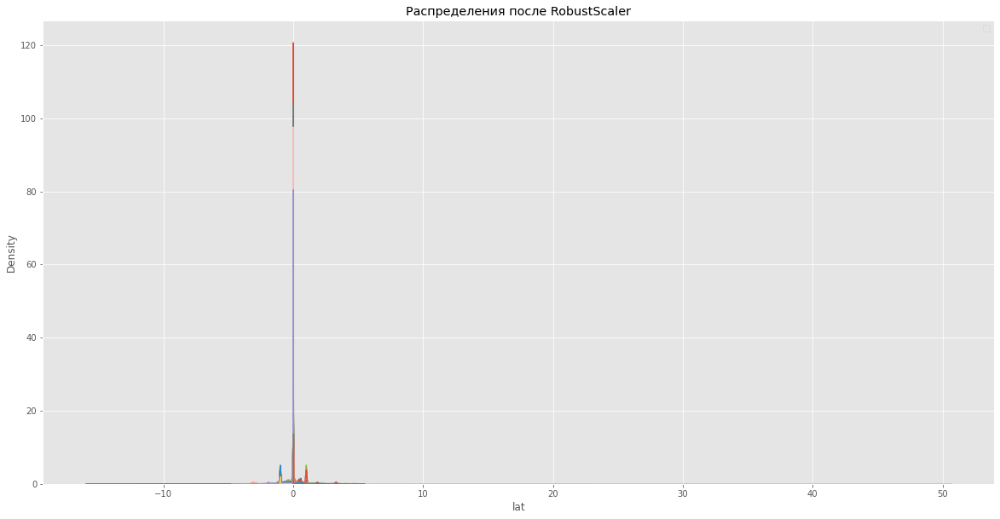

In [56]:
# Инициализируем нормализатор RobustScaler
r_scaler = preprocessing.RobustScaler()

# Кодируем исходный датасет
hotels_df_r = r_scaler.fit_transform(hotels_df)

# Преобразуем промежуточный датасет в полноценный датафрейм для визуализации
hotels_df_r = pd.DataFrame(hotels_df_r, columns=list(hotels_df.columns))

fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Распределения после RobustScaler')

sns.kdeplot(hotels_df_r['lat'], ax=ax1)
sns.kdeplot(hotels_df_r['lng'], ax=ax1)
sns.kdeplot(hotels_df_r['average_score'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_score'], ax=ax1)
sns.kdeplot(hotels_df_r['review_year'], ax=ax1)
sns.kdeplot(hotels_df_r['review_month'], ax=ax1)
sns.kdeplot(hotels_df_r['review_day'], ax=ax1)
sns.kdeplot(hotels_df_r['days_since_review'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_london'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_paris'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_amsterdam'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_milan'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_vienna'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_barcelona'], ax=ax1)
sns.kdeplot(hotels_df_r['neg_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_r['neu_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_r['pos_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_r['compound_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_r['neg_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_r['neu_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_r['pos_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_r['compound_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_r['total_number_of_reviews'], ax=ax1)
sns.kdeplot(hotels_df_r['review_total_negative_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_r['review_total_positive_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_r['total_number_of_reviews_reviewer_has_given'], ax=ax1)
sns.kdeplot(hotels_df_r['additional_number_of_scoring'], ax=ax1)
sns.kdeplot(hotels_df_r['lat_city'], ax=ax1)
sns.kdeplot(hotels_df_r['lng_city'], ax=ax1)
sns.kdeplot(hotels_df_r['hotel_distance_to_center'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_num'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_is_citizen'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_0'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_1'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_2'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_3'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_4'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_5'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_6'], ax=ax1)
sns.kdeplot(hotels_df_r['reviewer_nationality_7'], ax=ax1)
sns.kdeplot(hotels_df_r['count_tags'], ax=ax1)
sns.kdeplot(hotels_df_r['business_trip'], ax=ax1)
sns.kdeplot(hotels_df_r['leisure_trip'], ax=ax1)
sns.kdeplot(hotels_df_r['unknown_trip'], ax=ax1)
sns.kdeplot(hotels_df_r['other_rooms'], ax=ax1)
sns.kdeplot(hotels_df_r['standard_double_room'], ax=ax1)
sns.kdeplot(hotels_df_r['superior_double_room'], ax=ax1)
sns.kdeplot(hotels_df_r['double_room'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_1_night'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_2_nights'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_3_nights'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_4_nights'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_r['stayed_more_than_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_couple'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_solo'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_with_young_children'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_with_older_children'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_with_a_pet'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_group'], ax=ax1)
sns.kdeplot(hotels_df_r['trip_with_friends'], ax=ax1)
sns.kdeplot(hotels_df_r['studio_class'], ax=ax1)
sns.kdeplot(hotels_df_r['standard_class'], ax=ax1)
sns.kdeplot(hotels_df_r['other_class'], ax=ax1)
sns.kdeplot(hotels_df_r['bedroom_class'], ax=ax1)
sns.kdeplot(hotels_df_r['superior_class'], ax=ax1)
sns.kdeplot(hotels_df_r['apartment_class'], ax=ax1)
sns.kdeplot(hotels_df_r['suite_class'], ax=ax1)
sns.kdeplot(hotels_df_r['family_room_class'], ax=ax1)
sns.kdeplot(hotels_df_r['duplex_class'], ax=ax1)
sns.kdeplot(hotels_df_r['unknown_option'], ax=ax1)
sns.kdeplot(hotels_df_r['double_option'], ax=ax1)
sns.kdeplot(hotels_df_r['triple_option'], ax=ax1)
sns.kdeplot(hotels_df_r['single_option'], ax=ax1)
sns.kdeplot(hotels_df_r['other_beds'], ax=ax1)
sns.kdeplot(hotels_df_r['double_bed'], ax=ax1)
sns.kdeplot(hotels_df_r['king_bed'], ax=ax1)
sns.kdeplot(hotels_df_r['queen_bed'], ax=ax1)
sns.kdeplot(hotels_df_r['single_bed'], ax=ax1)
sns.kdeplot(hotels_df_r['sofa_bed'], ax=ax1)
sns.kdeplot(hotels_df_r['twin_bed'], ax=ax1)
plt.legend()

In [57]:
# Составляем список факторов (исключили целевой столбец)
features_r = hotels_df_r.drop('reviewer_score', axis=1).columns

# Составляем матрицу наблюдений X_r и вектор правильных ответов y_r
X_r = hotels_df_r[features_r]
y_r = hotels_df_r['reviewer_score']

<AxesSubplot:>

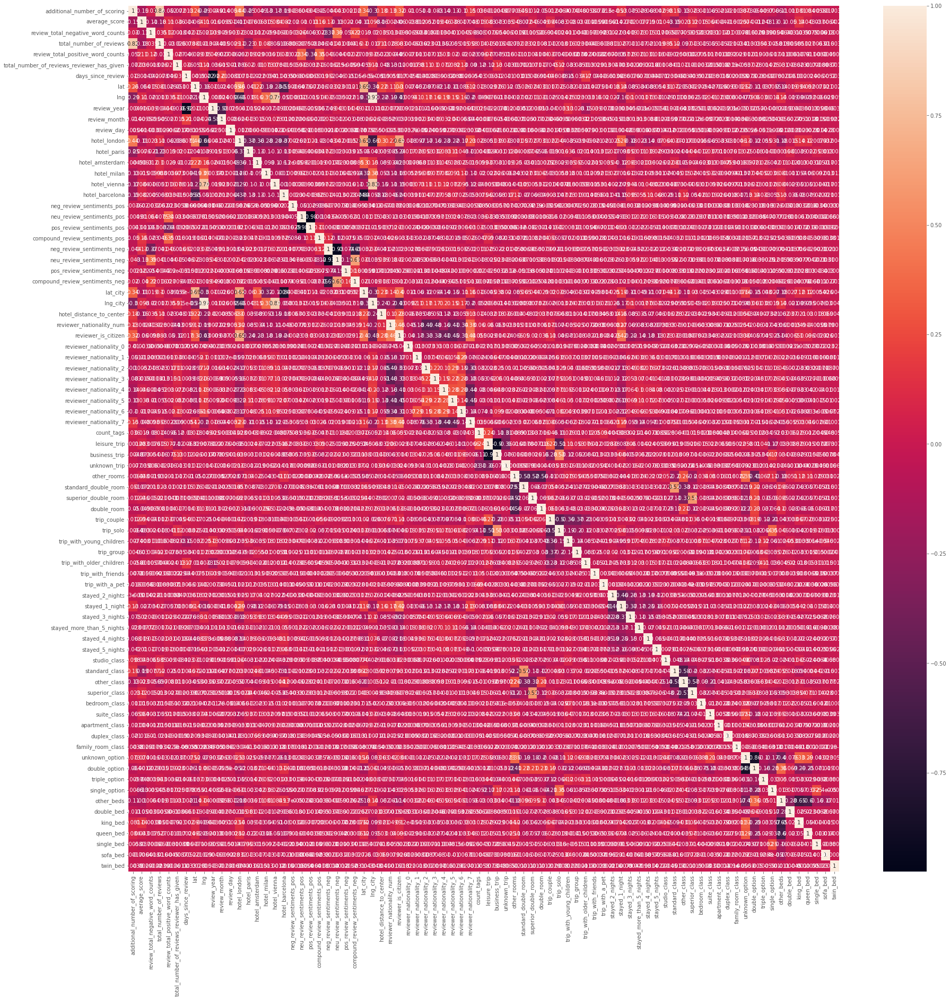

In [58]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_r.corr(), annot=True)

<AxesSubplot:>

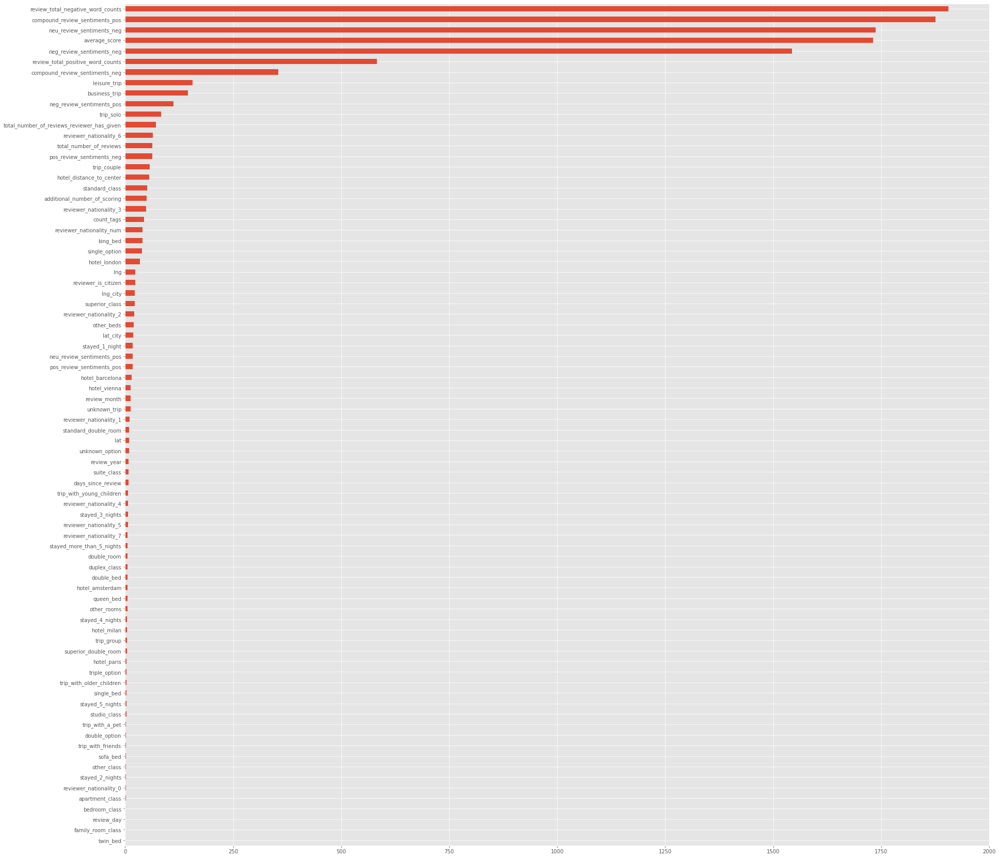

In [59]:
# Для оценки значимости переменных будем использовать функцию f_classif
imp_num = pd.Series(f_classif(X_r[col_names], y_r)[0], index=col_names)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

In [60]:
# Удаляем признаки с высокой корреляцией
X_r = X_r.drop([
    'additional_number_of_scoring',
    'days_since_review',
    'hotel_vienna',
    'lng_city',
    'pos_review_sentiments_pos',
    'neg_review_sentiments_neg',
    'lat',
    'business_trip',
    'double_option',
    'hotel_barcelona',
    'lng'
], axis=1)

Для того, чтобы убедиться в отсутствии высококоррелированных связей между признаками повторно выводим тепловую карту

<AxesSubplot:>

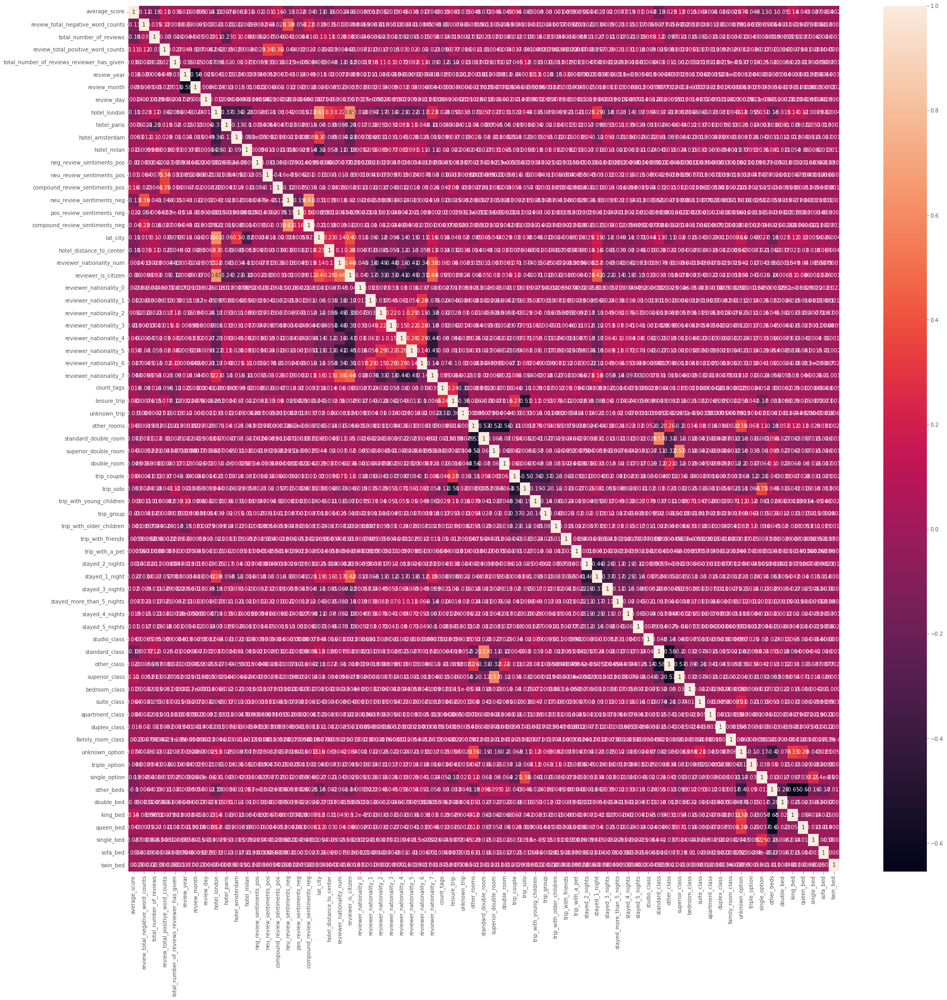

In [61]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_r.corr(), annot=True)

In [62]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" — для тестирования.
# Для тестирования мы будем использовать 25 % от исходного датасета.
X_r_train, X_r_test, y_r_train, y_r_test = train_test_split(X_r, y_r, test_size=0.25, random_state=42)

# Создаём модель
regr_r = RandomForestRegressor(n_estimators=100)

# Обучаем модель на тренировочном наборе данных
regr_r.fit(X_r_train, y_r_train)

# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_r_pred
y_r_pred = regr_r.predict(X_r_test)

In [63]:
# Сравниваем предсказанные значения (y_r_pred) с реальными (y_r_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.
print('MAPE r:', metrics.mean_absolute_percentage_error(y_r_test, y_r_pred))

MAPE r: 121731841895119.98


### <center> Воспользуемся методом стандартизации данных (StandardScaler)

No handles with labels found to put in legend.


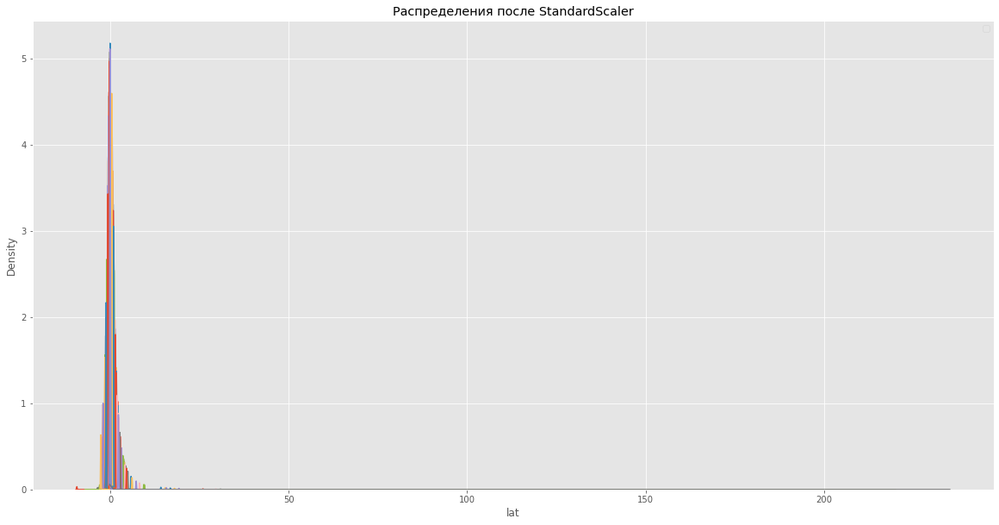

In [64]:
# Инициализируем стандартизатор StandardScaler
s_scaler = preprocessing.StandardScaler()

# Кодируем исходный датасет
hotels_df_s = s_scaler.fit_transform(hotels_df)

# Преобразуем промежуточный датасет в полноценный датафрейм для визуализации
hotels_df_s = pd.DataFrame(hotels_df_s, columns=list(hotels_df.columns))

fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Распределения после StandardScaler')

sns.kdeplot(hotels_df_s['lat'], ax=ax1)
sns.kdeplot(hotels_df_s['lng'], ax=ax1)
sns.kdeplot(hotels_df_s['average_score'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_score'], ax=ax1)
sns.kdeplot(hotels_df_s['review_year'], ax=ax1)
sns.kdeplot(hotels_df_s['review_month'], ax=ax1)
sns.kdeplot(hotels_df_s['review_day'], ax=ax1)
sns.kdeplot(hotels_df_s['days_since_review'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_london'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_paris'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_amsterdam'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_milan'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_vienna'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_barcelona'], ax=ax1)
sns.kdeplot(hotels_df_s['neg_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_s['neu_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_s['pos_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_s['compound_review_sentiments_pos'], ax=ax1)
sns.kdeplot(hotels_df_s['neg_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_s['neu_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_s['pos_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_s['compound_review_sentiments_neg'], ax=ax1)
sns.kdeplot(hotels_df_s['total_number_of_reviews'], ax=ax1)
sns.kdeplot(hotels_df_s['review_total_negative_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_s['review_total_positive_word_counts'], ax=ax1)
sns.kdeplot(hotels_df_s['total_number_of_reviews_reviewer_has_given'], ax=ax1)
sns.kdeplot(hotels_df_s['additional_number_of_scoring'], ax=ax1)
sns.kdeplot(hotels_df_s['lat_city'], ax=ax1)
sns.kdeplot(hotels_df_s['lng_city'], ax=ax1)
sns.kdeplot(hotels_df_s['hotel_distance_to_center'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_num'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_is_citizen'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_0'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_1'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_2'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_3'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_4'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_5'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_6'], ax=ax1)
sns.kdeplot(hotels_df_s['reviewer_nationality_7'], ax=ax1)
sns.kdeplot(hotels_df_s['count_tags'], ax=ax1)
sns.kdeplot(hotels_df_s['business_trip'], ax=ax1)
sns.kdeplot(hotels_df_s['leisure_trip'], ax=ax1)
sns.kdeplot(hotels_df_s['unknown_trip'], ax=ax1)
sns.kdeplot(hotels_df_s['other_rooms'], ax=ax1)
sns.kdeplot(hotels_df_s['standard_double_room'], ax=ax1)
sns.kdeplot(hotels_df_s['superior_double_room'], ax=ax1)
sns.kdeplot(hotels_df_s['double_room'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_1_night'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_2_nights'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_3_nights'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_4_nights'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_s['stayed_more_than_5_nights'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_couple'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_solo'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_with_young_children'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_with_older_children'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_with_a_pet'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_group'], ax=ax1)
sns.kdeplot(hotels_df_s['trip_with_friends'], ax=ax1)
sns.kdeplot(hotels_df_s['studio_class'], ax=ax1)
sns.kdeplot(hotels_df_s['standard_class'], ax=ax1)
sns.kdeplot(hotels_df_s['other_class'], ax=ax1)
sns.kdeplot(hotels_df_s['bedroom_class'], ax=ax1)
sns.kdeplot(hotels_df_s['superior_class'], ax=ax1)
sns.kdeplot(hotels_df_s['apartment_class'], ax=ax1)
sns.kdeplot(hotels_df_s['suite_class'], ax=ax1)
sns.kdeplot(hotels_df_s['family_room_class'], ax=ax1)
sns.kdeplot(hotels_df_s['duplex_class'], ax=ax1)
sns.kdeplot(hotels_df_s['unknown_option'], ax=ax1)
sns.kdeplot(hotels_df_s['double_option'], ax=ax1)
sns.kdeplot(hotels_df_s['triple_option'], ax=ax1)
sns.kdeplot(hotels_df_s['single_option'], ax=ax1)
sns.kdeplot(hotels_df_s['other_beds'], ax=ax1)
sns.kdeplot(hotels_df_s['double_bed'], ax=ax1)
sns.kdeplot(hotels_df_s['king_bed'], ax=ax1)
sns.kdeplot(hotels_df_s['queen_bed'], ax=ax1)
sns.kdeplot(hotels_df_s['single_bed'], ax=ax1)
sns.kdeplot(hotels_df_s['sofa_bed'], ax=ax1)
sns.kdeplot(hotels_df_s['twin_bed'], ax=ax1)
plt.legend()

In [65]:
# Составляем список факторов (исключили целевой столбец)
features_s = hotels_df_s.drop('reviewer_score', axis=1).columns

# Составляем матрицу наблюдений X_s и вектор правильных ответов y_s
X_s = hotels_df_s[features_s]
y_s = hotels_df_s['reviewer_score']

<AxesSubplot:>

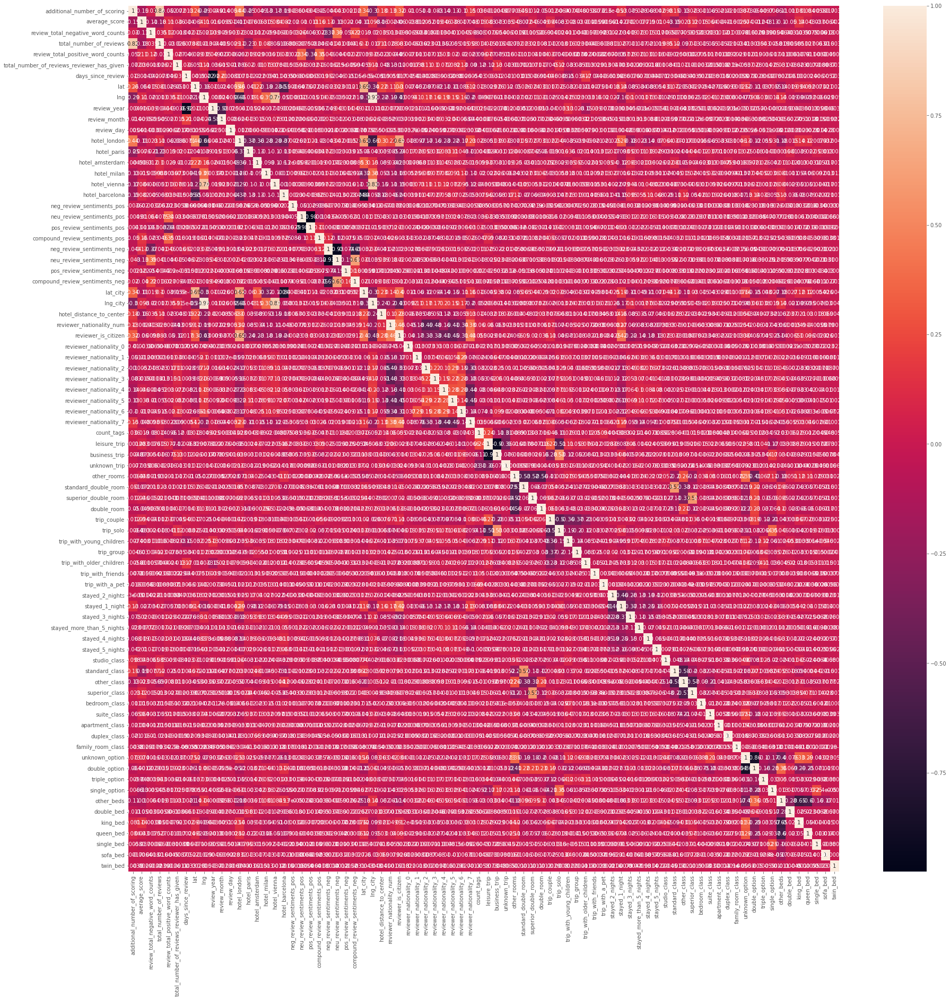

In [66]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_s.corr(), annot=True)

<AxesSubplot:>

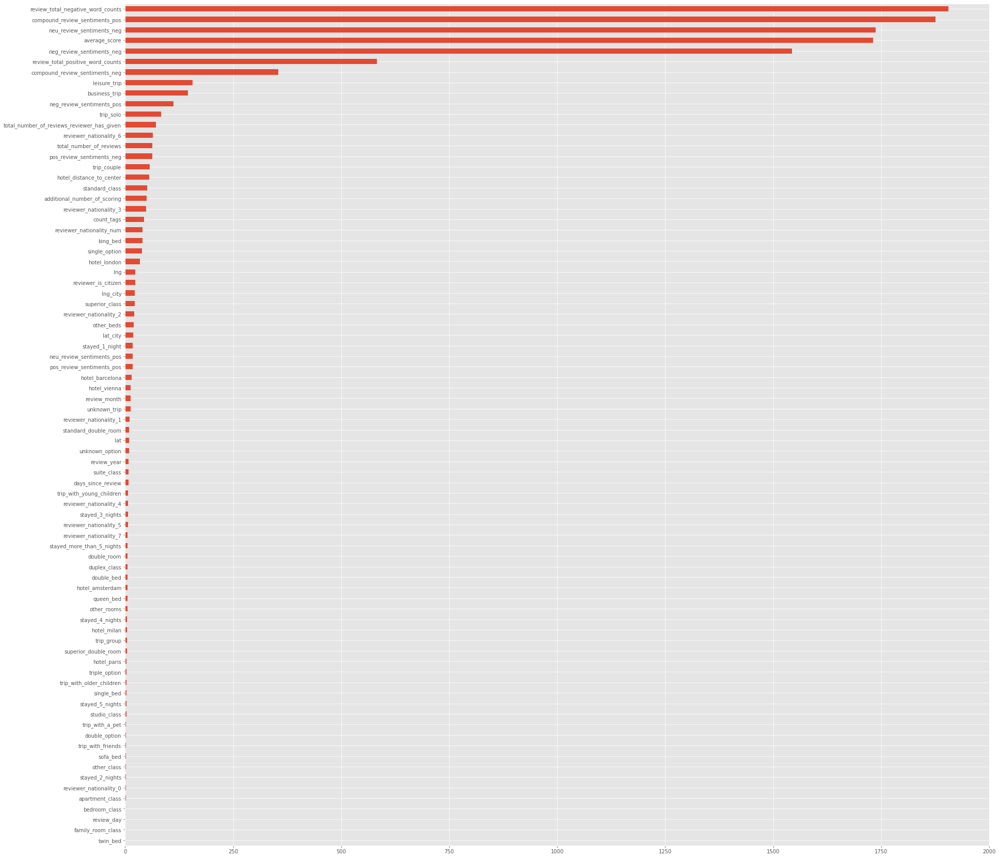

In [67]:
# Для оценки значимости переменных будем использовать функцию f_classif
imp_num = pd.Series(f_classif(X_s[col_names], y_s)[0], index=col_names)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

In [68]:
# Удаляем признаки с высокой корреляцией
X_s = X_s.drop([
    'additional_number_of_scoring',
    'days_since_review',
    'hotel_vienna',
    'lng_city',
    'pos_review_sentiments_pos',
    'neg_review_sentiments_neg',
    'lat',
    'business_trip',
    'double_option',
    'hotel_barcelona',
    'lng'
], axis=1)

Для того, чтобы убедиться в отсутствии высококоррелированных связей между признаками повторно выводим тепловую карту

<AxesSubplot:>

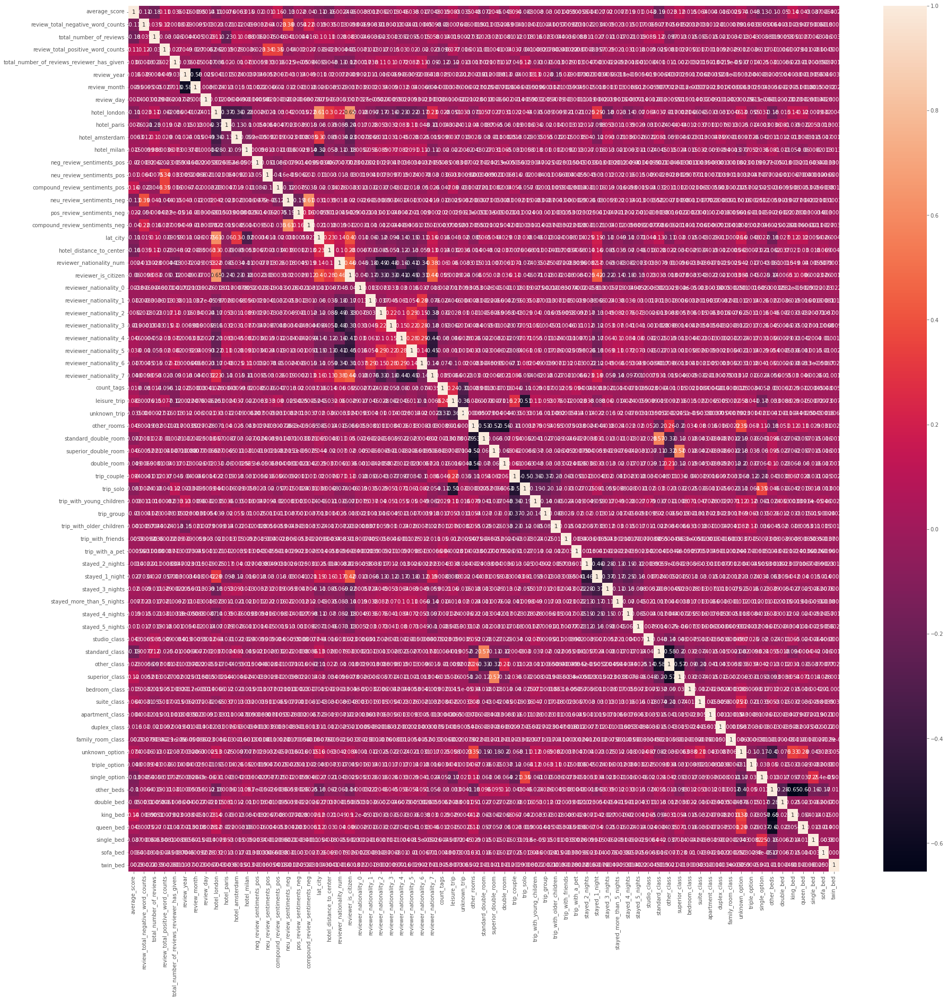

In [69]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(X_s.corr(), annot=True)

In [70]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" — для тестирования.
# Для тестирования мы будем использовать 25 % от исходного датасета.
X_s_train, X_s_test, y_s_train, y_s_test = train_test_split(X_s, y_s, test_size=0.25, random_state=42)

# Создаём модель
regr_s = RandomForestRegressor(n_estimators=100)

# Обучаем модель на тренировочном наборе данных
regr_s.fit(X_s_train, y_s_train)

# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_s_pred
y_s_pred = regr_s.predict(X_s_test)

In [71]:
# Сравниваем предсказанные значения (y_s_pred) с реальными (y_s_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.
print('MAPE s:', metrics.mean_absolute_percentage_error(y_s_test, y_s_pred))

MAPE s: 1.2893469796602721


### <center> Вывод

По окончании обработки данных была получена метрика MAPE: 0.12836726625246722. При попытке использования методов нормализации (MinMaxScaler, RobustScaler) а также метода стандартизации (StandardScaler) были получены следующие значения MAPE: при MinMaxScaler - 9550506901745.434, при RobustScaler - 121731841895119.98, при StandardScaler - 1.2893469796602721. Так как данные значения метрики чрезмерно велики, мы можем сделать вывод, что полученному датасету не требуется ни нормализация, ни стандартизация, что так же означает, что разброс в данных минимальный.